In [ ]:
!pip install -q tensorboard ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.5/756.5 kB 4.7 MB/s eta 0:00:00


In [ ]:
import os
import time
import json
import requests
from zipfile import ZipFile
import tarfile
from shutil import copyfile
from dataclasses import dataclass, field

import yaml
import glob

import random
import numpy as np
import pandas as pd
import cv2

from ultralytics import YOLO

import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# !gdown 1-FNNGcdtAQRehYYkGY1y4wzFNg4iWNad
# !mv /content/ap-10k.zip /content/drive/MyDrive/VR_Project

In [ ]:
#ls /content/drive/MyDrive/VR_Project/ap-10k.zip

/content/drive/MyDrive/VR_Project/ap-10k.zip


In [ ]:
#!unzip "/content/drive/MyDrive/VR_Project/ap-10k.zip" -d /content/drive/MyDrive/VR_Project

In [ ]:
ls /content/drive/MyDrive/VR_Project/ap-10k/

annotations/  data/


In [ ]:
ls /content/drive/MyDrive/VR_Project/ap-10k/annotations

ap10k-test-split1.json  ap10k-train-split1.json  ap10k-val-split1.json
ap10k-test-split2.json  ap10k-train-split2.json  ap10k-val-split2.json
ap10k-test-split3.json  ap10k-train-split3.json  ap10k-val-split3.json


In [ ]:
cat /content/drive/MyDrive/VR_Project/ap-10k/annotations/ap10k-test-split1.json

In [ ]:
import json
import os

def merge_json_files(file_path):
    merged_data = {
        'images': [],
        'annotations': [],
        'categories': []
        }
    with open(file_path, 'r') as file:
      data = json.load(file)
      merged_data['images'].extend(data.get('images', []))
      merged_data['annotations'].extend(data.get('annotations', []))
      merged_data['categories'].extend(data.get('categories', []))
    return merged_data

base_folder = '/content/drive/MyDrive/VR_Project/ap-10k/annotations/'

i=1 # split 1

test_file = os.path.join(base_folder, f'ap10k-test-split{i}.json')
train_file = os.path.join(base_folder, f'ap10k-train-split{i}.json')
val_file = os.path.join(base_folder, f'ap10k-val-split{i}.json')

# Fusion des fichiers
test_data = merge_json_files(test_file)
train_data = merge_json_files(train_file)
val_data = merge_json_files(val_file)

In [ ]:
for key, value in train_data.items():
    print(key)

images
annotations
categories


In [ ]:
print(train_data['annotations'][0])
print(train_data['images'][0])
print(train_data['categories'][0])

{'id': 441, 'image_id': 371, 'category_id': 1, 'bbox': [255, 209, 483, 387], 'area': 186921, 'iscrowd': 0, 'num_keypoints': 16, 'keypoints': [0, 0, 0, 681, 464, 2, 687, 527, 2, 612, 380, 2, 312, 257, 2, 501, 401, 2, 516, 467, 2, 528, 542, 2, 570, 401, 2, 627, 449, 2, 612, 539, 2, 321, 362, 2, 276, 404, 2, 282, 548, 2, 357, 374, 2, 321, 428, 2, 348, 563, 2]}
{'license': 1, 'id': 371, 'file_name': '000000000371.jpg', 'width': 1024, 'height': 768, 'background': 2}
{'id': 1, 'name': 'antelope', 'supercategory': 'Bovidae', 'keypoints': ['left_eye', 'right_eye', 'nose', 'neck', 'root_of_tail', 'left_shoulder', 'left_elbow', 'left_front_paw', 'right_shoulder', 'right_elbow', 'right_front_paw', 'left_hip', 'left_knee', 'left_back_paw', 'right_hip', 'right_knee', 'right_back_paw'], 'skeleton': [[1, 2], [1, 3], [2, 3], [3, 4], [4, 5], [4, 6], [6, 7], [7, 8], [4, 9], [9, 10], [10, 11], [5, 12], [12, 13], [13, 14], [5, 15], [15, 16], [16, 17]]}


In [ ]:
print(len(test_data['images']))
print(len(test_data['annotations']))
print(len(test_data['categories']))

1997
2634
54


In [ ]:
print(len(train_data['images']))
print(len(train_data['annotations']))
print(len(train_data['categories']))

7023
9122
54


In [ ]:
print(len(val_data['images']))
print(len(val_data['annotations']))
print(len(val_data['categories']))

995
1272
54


Total images: 10015


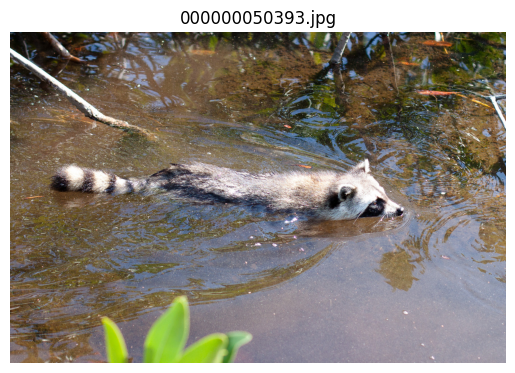

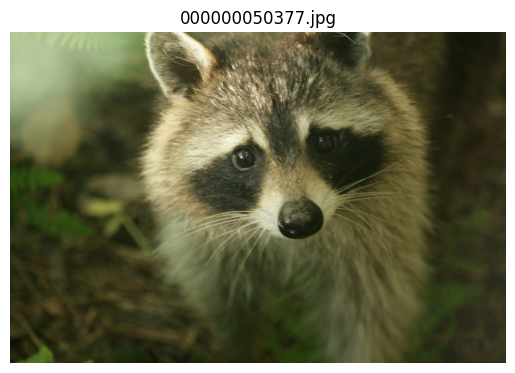

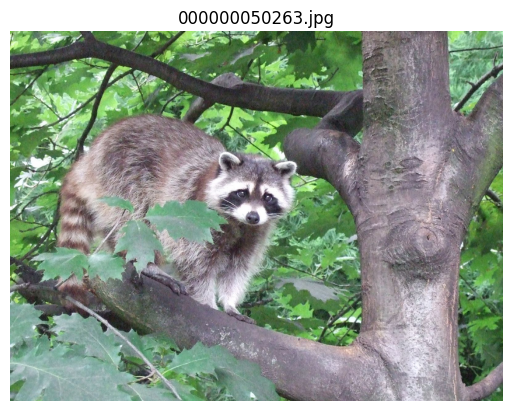

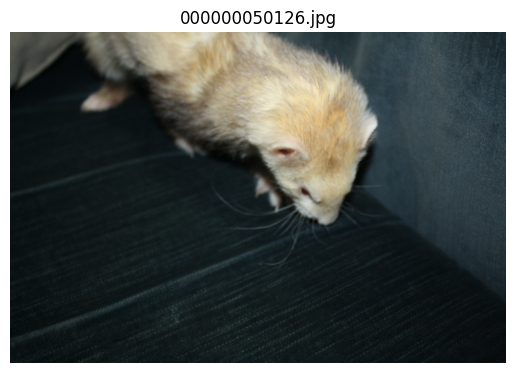

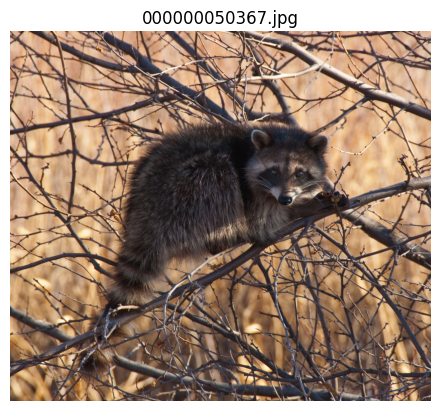

...

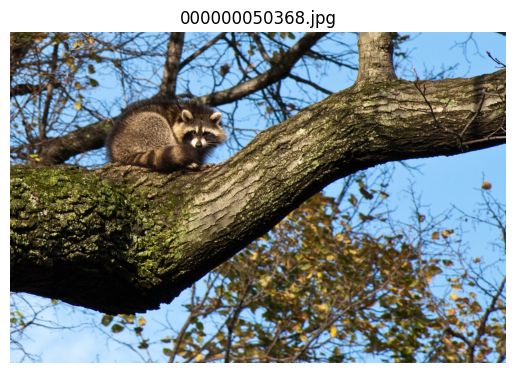

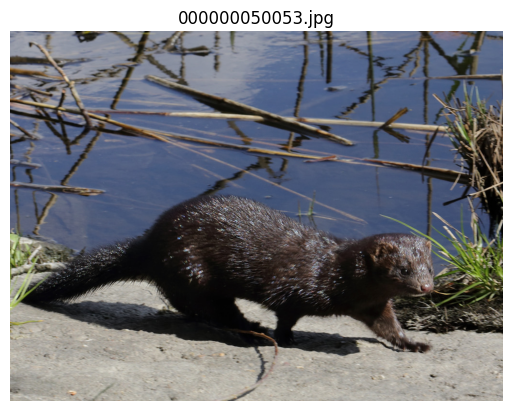

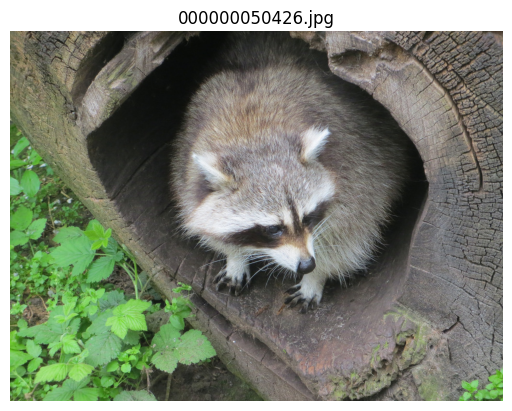

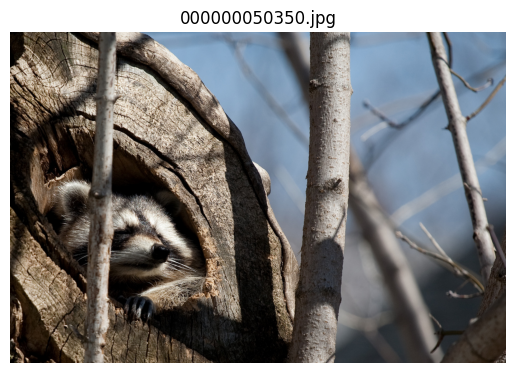

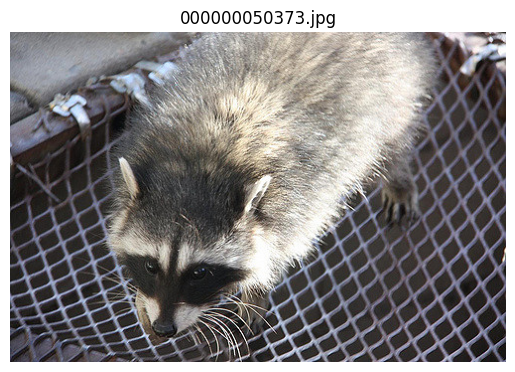

Affichage limité aux premières 20 images.


In [ ]:
# Afficher toutes les images décompressées
import os
from PIL import Image
import matplotlib.pyplot as plt

# Répertoire contenant les images décompressées
image_directory = '/content/drive/MyDrive/VR_Project/ap-10k/data'
images = os.listdir(image_directory)

# S'assurer que la sortie ne soit pas trop volumineuse pour un affichage pratique
print(f"Total images: {len(images)}")
max_images_to_show = 20  # Vous pouvez ajuster ce nombre

# Afficher les images
for i, image_name in enumerate(images):
    if i >= max_images_to_show:
        print("Affichage limité aux premières 20 images.")
        break
    image_path = os.path.join(image_directory, image_name)
    img = Image.open(image_path)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_name)
    plt.show()



We will maintain the following directory structure for YOLOv8 dataset:

```python
animal-pose-data
├── train
│   ├── images (6773 files)
│   └── labels (6773 files)
└── valid
    ├── images (1703 files)
    └── labels (1703 files)
```

In [ ]:
DATA_DIR = "/content/drive/MyDrive/VR_Project/animal-pose-data"

TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"

TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"

VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)

os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

### 3.1 Copy Image files

In [ ]:
# for data in train_data['images']:
#     img_file = data["file_name"]
#     filename = img_file.split("/")[-1]
#     copyfile(os.path.join("/content/drive/MyDrive/VR_Project/ap-10k/data/", img_file),
#              os.path.join(TRAIN_IMG_PATH, filename))


# for data in test_data['images']:
#     img_file = data["file_name"]
#     filename = img_file.split("/")[-1]
#     copyfile(os.path.join("/content/drive/MyDrive/VR_Project/ap-10k/data/", img_file),
#              os.path.join(VALID_IMG_PATH, filename))

### 3.2 Create YOLO Annotation TXT FILES





Our final task for data preparation is to create the boxes and the keypoint annotations in accordance with Ultralytics’ YOLO. Since we will deal with a single class (i.e., animal), we set the class index to **`0`**.

In [ ]:
CLASS_ID = 0

The function **`create_yolo_boxes_kpts`** performs the following tasks:

* Modifies visibility indicators for keypoints (setting the visibilities for labeled keypoints to 2).
* Normalizes the coordinates of both bounding boxes and keypoints relative to the image dimensions.
* Converts bounding boxes to $[x_{center}, \ , y_{center},\ width,\ height]$ in normalized form.

In [ ]:
def create_yolo_txt_files(data, LABEL_PATH):
  for item in data['annotations']:
      image_id = item['image_id']
      image_data = next((img for img in data['images'] if img['id'] == image_id), None)
      if not image_data:
          print(f'image of id {image_id} not found')
          continue

      img_width, img_height = image_data['width'], image_data['height']
      x_min, y_min, bbox_width, bbox_height = item['bbox']

      # Conversion en coordonnées centrées et normalisées
      x_center = round((x_min + bbox_width / 2) / img_width,5)
      y_center = round((y_min + bbox_height / 2) / img_height,5)
      width_norm = round(bbox_width / img_width,5)
      height_norm = round(bbox_height / img_height,5)

      # Extract keypoints
      keypoints = item['keypoints']
      num_keypoints = item['num_keypoints']
      keypoints_visibilities = [2 if keypoints[i+2] > 0 else 0 for i in range(0, len(keypoints), 3)]
      landmark_kpts = [(keypoints[i], keypoints[i+1], keypoints_visibilities[i//3]) for i in range(0, len(keypoints), 3)]

      # Format keypoints into YOLO format
      kpts_yolo = np.array(landmark_kpts, dtype=np.float32)[:, :2] / np.array([img_width, img_height])

      # Append keypoints to the YOLO annotation string
      kpts_flattend = [round(ele, 5) for ele in kpts_yolo.flatten().tolist()]


      TXT_FILE = image_data["file_name"].split(".")[0]+".txt"
      with open(os.path.join(LABEL_PATH, TXT_FILE), "w") as f:
            line = f"{CLASS_ID} {x_center} {y_center} {width_norm} {height_norm} "
            line+= " ".join(map(str, kpts_flattend))
            f.write(line)

We will finally create the `txt` files for YOLO based on the `train_json_data` and `val_json_data` obtained earlier. The function `create_yolo_txt_files` creates the required `txt` annotations in YOLO using the `create_yolo_boxes_kpts` utility function explained above.

In [ ]:
# create_yolo_txt_files(train_data, TRAIN_LABEL_PATH)
# create_yolo_txt_files(test_data, VALID_LABEL_PATH)

## 4 Data Visualization

In [ ]:
train_images = os.listdir(TRAIN_IMG_PATH)
valid_images = os.listdir(VALID_IMG_PATH)


train_labels = os.listdir(TRAIN_LABEL_PATH)
valid_labels = os.listdir(VALID_LABEL_PATH)
print(f"Training images: {len(train_images)}, Validation Images: {len(valid_images)}")
print(f"Training labels: {len(train_labels)}, Validation Labels: {len(valid_labels)}")
print(len(train_data['images']))
print(len(test_data['images']))

Training images: 6105, Validation Images: 0
Training labels: 0, Validation Labels: 0
7023
1997


The `draw_landmarks` function is used to annotate the corresponding landmark points on the image using COLORS_RGB_MAP.

In [ ]:
def draw_landmarks(image, landmarks):

    radius = 5
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        radius = 8

    for idx, kpt_data in enumerate(landmarks):

        loc_x, loc_y = kpt_data[:2].astype("int").tolist()

        cv2.circle(image,
                   (loc_x, loc_y),
                   radius,
                   color=(0,0,255),
                   thickness=-1,
                   lineType=cv2.LINE_AA)

    return image

The `draw_boxes` function is used to annotate the bounding boxes along with the confidence scores (if passed) on the image.

In [ ]:
def draw_boxes(image, detections, class_name = "animal", score=None, color=(0,255,0)):

    font_size = 0.25 + 0.07 * min(image.shape[:2]) / 100
    font_size = max(font_size, 0.5)
    font_size = min(font_size, 0.8)
    text_offset = 3

    thickness = 2
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        thickness = 10

    xmin, ymin, xmax, ymax = detections[:4].astype("int").tolist()
    conf = round(float(detections[-1]),2)
    cv2.rectangle(image,
                  (xmin, ymin),
                  (xmax, ymax),
                  color=(0,255,0),
                  thickness=thickness,
                  lineType=cv2.LINE_AA)

    display_text = f"{class_name}"

    if score is not None:
        display_text+=f": {score:.2f}"

    (text_width, text_height), _ = cv2.getTextSize(display_text,
                                                   cv2.FONT_HERSHEY_SIMPLEX,
                                                   font_size, 2)

    cv2.rectangle(image,
                      (xmin, ymin),
                      (xmin + text_width + text_offset, ymin - text_height - int(15 * font_size)),
                      color=color, thickness=-1)

    image = cv2.putText(
                    image,
                    display_text,
                    (xmin + text_offset, ymin - int(10 * font_size)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_size,
                    (0, 0, 0),
                    2, lineType=cv2.LINE_AA,
                )

    return image

The `visualize_annotations` is used to annotate both the bounding box coordinates and the landmark keypoints on the corresponding image after converting them to absoulute coordinates.

Recall that both the bounding box coordinates and the keypoints were normalized in the range `[0, 1]`. However, to plot them, we need the absolute coordinates.

The conversion mapping from YOLO bboxes to $[x_{min}, y_{min}, x_{max}, y_{max}]$ is pretty straight forward and can be obtained using the following set of equations:

$$x_{min} = \frac{W}{2} (2x_{center} \ - \ width)$$

$$y_{min} = \frac{H}{2} (2y_{center} \ - \ height)$$

$$x_{max} = x_{min} + width * W$$

$$y_{max} = y_{min} + height * H$$


Similarly, the keypoints can denormalized (to the absolute coordinates) using:

$$x_{abs} = x_{norm}* W$$

$$y_{abs} = y_{norm}* H$$


Here, the `width` and `height` are the box width and height respectively; whereas `W` and `H` are the image width and height respectively.

In [ ]:
def visualize_annotations(image, box_data, keypoints_data):

    image = image.copy()

    shape_multiplier = np.array(image.shape[:2][::-1]) # (W, H).
    # Final absolute coordinates (xmin, ymin, xmax, ymax).
    denorm_boxes = np.zeros_like(box_data)

    # De-normalize center coordinates from YOLO to (xmin, ymin).
    denorm_boxes[:, :2] = (shape_multiplier/2.) * (2*box_data[:,:2] - box_data[:,2:])

    # De-normalize width and height from YOLO to (xmax, ymax).
    denorm_boxes[:, 2:] = denorm_boxes[:,:2] + box_data[:,2:]*shape_multiplier

    for boxes, kpts in zip(denorm_boxes, keypoints_data):
        # De-normalize landmark coordinates.
        kpts[:, :2]*= shape_multiplier
        image = draw_boxes(image, boxes)
        image = draw_landmarks(image, kpts)

    return image

The following plot shows a few image samples with their corresponding ground truth annotation. The keypoint annotations are filtered based on their corresponding visibility flag.

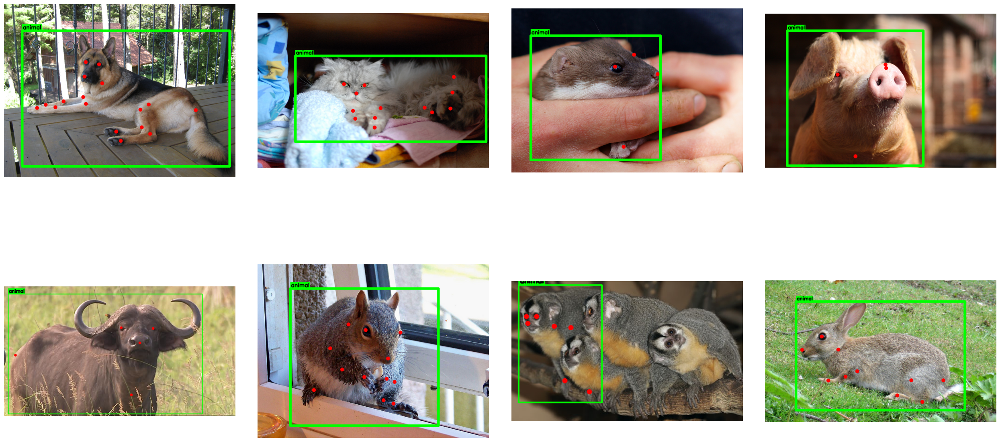

In [ ]:
IMAGE_FILES = os.listdir(TRAIN_IMG_PATH)
NUM_LANDMARKS = 17

num_samples = 8
num_rows = 2
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(45)
random.shuffle(IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(IMAGE_FILES[:num_samples], ax.flat)):

    image = cv2.imread(os.path.join(TRAIN_IMG_PATH, file))

    # Obtain the txt file for the corresponding image file.
    filename = file.split(".")[0]
    # Split each object instance in separate lists.
    with open(os.path.join(TRAIN_LABEL_PATH, filename+".txt"), "r") as file:
        label_data = [x.split() for x in file.read().strip().splitlines() if len(x)]

    label_data = np.array(label_data, dtype=np.float32)
    # YOLO BBox instances in [x-center, y-center, width, height] in normalized form.
    box_instances = label_data[:,1:5]
    # Shape: (N, 4), where, N = #instances per-image
    # Kpt instances.
    # Filter keypoints based on visibility.
    instance_kpts = []
    kpts_data = label_data[:,5:].reshape(-1, NUM_LANDMARKS, 2)

    for inst_kpt in kpts_data:
        vis_ids = np.where(inst_kpt[:, -1]>0.)[0]
        vis_kpts = inst_kpt[vis_ids][:,:2]
        vis_kpts = np.concatenate([vis_kpts, np.expand_dims(vis_ids, axis=-1)], axis=-1)
        instance_kpts.append(vis_kpts)

    image_ann = visualize_annotations(image, box_instances, instance_kpts)
    axis.imshow(image_ann[...,::-1])
    axis.axis("off")


plt.tight_layout(h_pad=4., w_pad=4.)
plt.show();

## 5 Configurations

### 5.1 Training Configuration

We shall define the training configuration for fine-tuning in the `TrainingConfig` class.

In [ ]:
@dataclass(frozen=True)
class TrainingConfig:
    DATASET_YAML:   str = "animal-keypoints.yaml"
    MODEL:          str = "yolov8n-pose.pt"
    EPOCHS:         int = 50
    KPT_SHAPE:    tuple = (17,3)
    PROJECT:        str = "Animal_Keypoints"
    NAME:           str = f"{MODEL.split('.')[0]}_{EPOCHS}_epochs"
    CLASSES_DICT:  dict = field(default_factory = lambda:{0 : "animal"})

NameError: name 'dataclass' is not defined

### 5.2 Data Configuration

The `DatasetConfig` class takes in the various hyperparameters related to the data such as the image size and batch size to be used while training, along with the various augmentation probabilities such as Mosaic, horizontal flip, etc.

In [ ]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:    int   = 640
    BATCH_SIZE:    int   = 16
    CLOSE_MOSAIC:  int   = 10
    MOSAIC:        float = 0.4
    FLIP_LR:       float = 0.0 # Turn off horizontal flip.

In [ ]:
train_config = TrainingConfig()
data_config = DatasetConfig()

Before we start our training, we need to create a `yaml` containing the path to the images and label files. We also need to specify the class names, starting from index=0 and the keypoint shape.

In [ ]:
current_dir = os.getcwd()
print(current_dir)
data_dict = dict(
                path      = os.path.join(current_dir, DATA_DIR),
                train     = os.path.join(TRAIN_DIR, TRAIN_FOLDER_IMG),
                val       = os.path.join(VALID_DIR, VALID_FOLDER_IMG),
                names     = train_config.CLASSES_DICT,
                kpt_shape = list(train_config.KPT_SHAPE),
               )

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

/content


## 6 Training

In [ ]:
pose_model = model = YOLO(train_config.MODEL)

pose_model.train(data    = train_config.DATASET_YAML,
            epochs       = train_config.EPOCHS,
            imgsz        = data_config.IMAGE_SIZE,
            batch        = data_config.BATCH_SIZE,
            project      = train_config.PROJECT,
            name         = train_config.NAME,
            close_mosaic = data_config.CLOSE_MOSAIC,
            mosaic       = data_config.MOSAIC,
            fliplr       = data_config.FLIP_LR
           )

Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=pose, mode=train, model=yolov8n-pose.pt, data=animal-keypoints.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Animal_Keypoints, name=yolov8n-pose_50_epochs2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tr

train: Scanning /content/drive/.shortcut-targets-by-id/1FFVrGpuYreWZkxF4jBlHQARZAeWsEGtC/VR_Project/animal-pose-data/train/labels... 75 images, 0 backgrounds, 75 corrupt:   1%|          | 75/7023 [00:42<4:05:11,  2.12s/it]